In [1]:
import os
import scanpy as sc
import matplotlib.pyplot as plt
import pandas as pd
import pathlib
import seaborn as sns
import numpy as np
from anndata import AnnData
import squidpy as sq

%load_ext lab_black
%load_ext autoreload
%autoreload 2

In [2]:
BASE_PATH = pathlib.Path(
    "/storage/groups/ml01/datasets/raw/20201214_SquidpyData_giovanni.palla/slideseqV2/SCP815/other"
)
DATA_PATH = ""

In [3]:
dge = np.sort(
    [fname for fname in os.listdir(BASE_PATH) if "digital_expression" in fname]
)
coords = np.sort(
    [fname for fname in os.listdir(BASE_PATH) if "bead_locations" in fname]
)

In [4]:
coords

array(['Puck_190921_19_bead_locations.csv',
       'Puck_190921_21_bead_locations.csv',
       'Puck_190926_01_bead_locations.csv',
       'Puck_190926_02_bead_locations.csv',
       'Puck_190926_03_bead_locations.csv',
       'Puck_190926_06_bead_locations.csv',
       'Puck_191007_07_bead_locations.csv',
       'Puck_191204_01_bead_locations.csv',
       'Puck_200115_08_bead_locations.csv'], dtype='<U33')

In [5]:
dge

array(['Puck_190921_19.digital_expression.txt.gz',
       'Puck_190921_21.digital_expression.txt.gz',
       'Puck_190926_01.digital_expression.txt.gz',
       'Puck_190926_02.digital_expression.txt.gz',
       'Puck_190926_03.digital_expression.txt.gz',
       'Puck_190926_06.digital_expression.txt.gz',
       'Puck_191007_07.digital_expression.txt.gz',
       'Puck_191204_01.digital_expression.txt.gz',
       'Puck_200115_08.digital_expression.txt'], dtype='<U40')

In [6]:
counts = pd.read_csv(
    BASE_PATH / "Puck_200115_08.digital_expression.txt", index_col=0, delimiter="\t"
)

In [15]:
genes = counts.index.values

In [8]:
counts_t = counts.T.copy()

In [9]:
counts_t

GENE,0610005C13Rik,0610007P14Rik,0610009B22Rik,0610009E02Rik,0610009L18Rik,0610009O20Rik,0610010F05Rik,0610010K14Rik,0610011F06Rik,0610012D04Rik,...,mt-Tq,mt-Tr,mt-Ts2,mt-Tt,mt-Tv,n-R5-8s1,n-R5s173,n-R5s33,n-R5s40,n-R5s95
AACGTCATAATCGT,0,1,1,0,0,1,2,0,5,0,...,0,0,0,0,2,0,0,0,0,0
TACTTTAGCGCAGT,0,0,0,0,0,0,0,0,2,0,...,2,0,1,0,1,0,0,0,0,0
CATGCCTGGGTTCG,0,0,2,0,0,0,3,0,2,0,...,1,0,0,0,2,0,0,0,0,0
TCGATATGGCACAA,0,2,0,0,0,0,1,0,3,0,...,0,0,0,0,1,0,0,0,0,0
TTATCTGACGAAGC,0,1,0,0,0,0,1,0,0,0,...,1,0,0,0,2,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ACAATACAGATACT,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
GGTCAGGTTAACGT,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
CATTATGGAATTCT,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
GACTTTTCTTAAAG,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [10]:
coords = pd.read_csv(
    BASE_PATH / "Puck_200115_08_bead_locations.csv",
    delimiter=",",
    skiprows=1,
    header=None,
)
coords.columns = ["barcode", "x", "y"]

In [11]:
coords

,barcode,x,y
0,AACGTCATAATCGT,888.95,3219.5
1,TACTTTAGCGCAGT,4762.20,5020.4
2,CATGCCTGGGTTCG,886.50,3199.6
3,TCGATATGGCACAA,2237.10,5144.6
4,TTATCTGACGAAGC,1031.80,2425.2
...,...,...,...
53203,ACAATACAGATACT,3025.50,5516.0
53204,GGTCAGGTTAACGT,3069.70,3211.9
53205,CATTATGGAATTCT,3507.10,2811.0
53206,GACTTTTCTTAAAG,2155.00,1264.3


In [12]:
import scipy

counts_sparse = scipy.sparse.csr_matrix(counts_t.to_numpy())
counts_sparse.eliminate_zeros()
adata = AnnData(counts_sparse, obs=coords)
adata.obs_names = coords.barcode.values
adata.var_names = genes

/home/icb/giovanni.palla/miniconda3/envs/spatial/lib/python3.8/site-packages/anndata/_core/anndata.py:119: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [13]:
adata.var_names_make_unique()
adata.var["MT"] = adata.var_names.str.startswith("mt-")
sc.pp.calculate_qc_metrics(adata, qc_vars=["MT"], inplace=True)

/home/icb/giovanni.palla/miniconda3/envs/spatial/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/icb/giovanni.palla/miniconda3/envs/spatial/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/icb/giovanni.palla/miniconda3/envs/spatial/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code

<AxesSubplot:xlabel='n_genes_by_counts'>

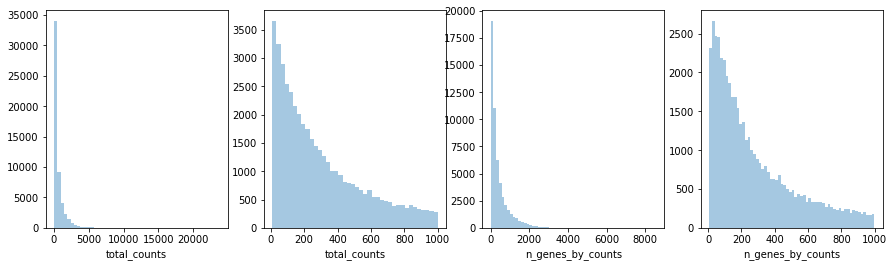

In [14]:
import seaborn as sns

fig, axs = plt.subplots(1, 4, figsize=(15, 4))
sns.distplot(adata.obs["total_counts"], kde=False, ax=axs[0])
sns.distplot(
    adata.obs["total_counts"][adata.obs["total_counts"] < 1000],
    kde=False,
    bins=40,
    ax=axs[1],
)
sns.distplot(adata.obs["n_genes_by_counts"], kde=False, bins=60, ax=axs[2])
sns.distplot(
    adata.obs["n_genes_by_counts"][adata.obs["n_genes_by_counts"] < 1000],
    kde=False,
    bins=60,
    ax=axs[3],
)

In [16]:
sc.pp.filter_cells(adata, min_counts=100)
sc.pp.filter_genes(adata, min_cells=10)

In [17]:
coords

,barcode,x,y
0,AACGTCATAATCGT,888.95,3219.5
1,TACTTTAGCGCAGT,4762.20,5020.4
2,CATGCCTGGGTTCG,886.50,3199.6
3,TCGATATGGCACAA,2237.10,5144.6
4,TTATCTGACGAAGC,1031.80,2425.2
...,...,...,...
53203,ACAATACAGATACT,3025.50,5516.0
53204,GGTCAGGTTAACGT,3069.70,3211.9
53205,CATTATGGAATTCT,3507.10,2811.0
53206,GACTTTTCTTAAAG,2155.00,1264.3


In [18]:
adata.obsm["spatial"] = coords[coords.barcode.isin(adata.obs_names.values)][
    ["x", "y"]
].to_numpy()

In [19]:
cond = ((adata.obsm["spatial"][:, 0] > 750) & (adata.obsm["spatial"][:, 0] < 5750)) & (
    (adata.obsm["spatial"][:, 1] > 670) & (adata.obsm["spatial"][:, 1] < 5700)
)

In [20]:
adata = adata[cond].copy()

In [21]:
sc.pp.highly_variable_genes(adata, flavor="seurat_v3", n_top_genes=4000)
sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)
adata.raw = adata
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(adata, resolution=0.7)

[autoreload of squidpy.datasets._dataset failed: Traceback (most recent call last):
  File "/home/icb/giovanni.palla/miniconda3/envs/spatial/lib/python3.8/site-packages/IPython/extensions/autoreload.py", line 245, in check
    superreload(m, reload, self.old_objects)
  File "/home/icb/giovanni.palla/miniconda3/envs/spatial/lib/python3.8/site-packages/IPython/extensions/autoreload.py", line 394, in superreload
    module = reload(module)
  File "/home/icb/giovanni.palla/miniconda3/envs/spatial/lib/python3.8/imp.py", line 314, in reload
    return importlib.reload(module)
  File "/home/icb/giovanni.palla/miniconda3/envs/spatial/lib/python3.8/importlib/__init__.py", line 169, in reload
    _bootstrap._exec(spec, module)
  File "<frozen importlib._bootstrap>", line 604, in _exec
  File "<frozen importlib._bootstrap_external>", line 783, in exec_module
  File "<frozen importlib._bootstrap>", line 219, in _call_with_frames_removed
  File "/storage/groups/ml01/code/giovanni.palla/squidpy/squi

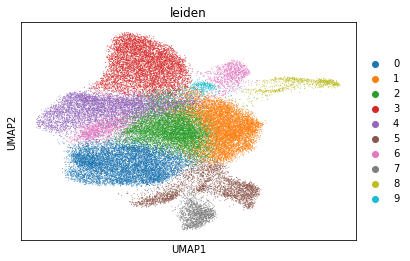

In [23]:
sc.pl.umap(adata, color="leiden")

In [24]:
anno = pd.read_csv(
    "/storage/groups/ml01/datasets/raw/20201214_SquidpyData_giovanni.palla/slideseqV2/barcode_clusters.csv"
)
deconv = pd.read_csv(
    "/storage/groups/ml01/datasets/raw/20201214_SquidpyData_giovanni.palla/slideseqV2/bead_deconv_df_norm.csv"
)

In [25]:
deconv

,Interneurons,Subiculum_Entorhinal_cl2,Subiculum_Entorhinal_cl3,DentatePyramids,CA1_CA2_CA3_Subiculum,Mural,Astrocytes,Oligodendrocytes,Polydendrocytes,Microglia,Ependymal,Endothelial_Tip,Neurogenesis,Endothelial_Stalk,barcode,max_cell_type,maxval,thresh_ct
0,0.113249,0.203010,0.086060,0.247319,0.153769,0.002455,0.072134,0.022327,0.008712,0.065562,0.003853,0.000000,0.000000,0.021550,AACGTCATAATCGT,4,0.247319,0.000000
1,0.055718,0.077973,0.048517,0.187755,0.195889,0.040198,0.126317,0.071605,0.052353,0.013668,0.016075,0.044060,0.012159,0.057714,TACTTTAGCGCAGT,5,0.195889,0.000000
2,0.108751,0.228845,0.109581,0.246070,0.115723,0.006306,0.071186,0.015768,0.000000,0.059735,0.000000,0.013702,0.000000,0.024332,CATGCCTGGGTTCG,4,0.246070,0.000000
3,0.108163,0.029694,0.112905,0.172960,0.122573,0.014295,0.065901,0.031834,0.096153,0.034155,0.094124,0.065322,0.011114,0.040808,TCGATATGGCACAA,4,0.172960,0.000000
4,0.065790,0.236463,0.012458,0.233441,0.145091,0.014810,0.097935,0.052590,0.023642,0.008578,0.014275,0.058715,0.000000,0.036213,TTATCTGACGAAGC,2,0.236463,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53182,0.026806,0.000000,0.000000,0.154486,0.692437,0.000000,0.126271,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,AAAATATTAAGCCC,5,0.692437,0.692437
53183,0.000000,0.188921,0.000000,0.520199,0.019765,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.271115,0.000000,ACAATACAGATACT,4,0.520199,0.520199
53184,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.749241,0.000000,0.000000,0.250759,0.000000,0.000000,0.000000,0.000000,CATTATGGAATTCT,7,0.749241,0.749241
53185,0.000000,0.000000,0.000000,0.067453,0.881551,0.002817,0.012518,0.000000,0.000000,0.012576,0.003112,0.019974,0.000000,0.000000,GACTTTTCTTAAAG,5,0.881551,0.881551


In [26]:
anno

,barcode,max_factor,atlas_cluster,named_clusters
0,AACGTCATAATCGT,4,4,DentatePyramids
1,TACTTTAGCGCAGT,19,5,CA1_CA2_CA3_Subiculum
2,CATGCCTGGGTTCG,4,4,DentatePyramids
3,TCGATATGGCACAA,4,4,DentatePyramids
4,TTATCTGACGAAGC,21,2,Subiculum_Entorhinal_cl2
...,...,...,...,...
53182,AAAATATTAAGCCC,28,5,CA1_CA2_CA3_Subiculum
53183,ACAATACAGATACT,4,4,DentatePyramids
53184,CATTATGGAATTCT,8,7,Astrocytes
53185,GACTTTTCTTAAAG,2,5,CA1_CA2_CA3_Subiculum


In [27]:
anno_c = anno[anno.barcode.isin(adata.obs_names.values)].copy()
np.testing.assert_array_equal(anno_c.barcode.values, adata.obs_names.values)

In [28]:
adata.obs["cluster"] = anno_c.named_clusters.values

In [29]:
deconv_c = deconv[deconv.barcode.isin(adata.obs_names.values)].copy()
np.testing.assert_array_equal(deconv_c.barcode.values, adata.obs_names.values)

In [33]:
deconv_c.index = adata.obs_names

In [34]:
adata.obsm["deconvolution_results"] = deconv_c

In [35]:
# for c in deconv_c.columns[0:14]:
#     print(c)
#     adata.obs[c] = deconv_c[c].values

In [36]:
adata

AnnData object with n_obs × n_vars = 41786 × 17733
    obs: 'barcode', 'x', 'y', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_MT', 'log1p_total_counts_MT', 'pct_counts_MT', 'n_counts', 'leiden', 'cluster'
    var: 'MT', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'hvg', 'log1p', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors'
    obsm: 'spatial', 'X_pca', 'X_umap', 'deconvolution_results'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

... storing 'cluster' as categorical


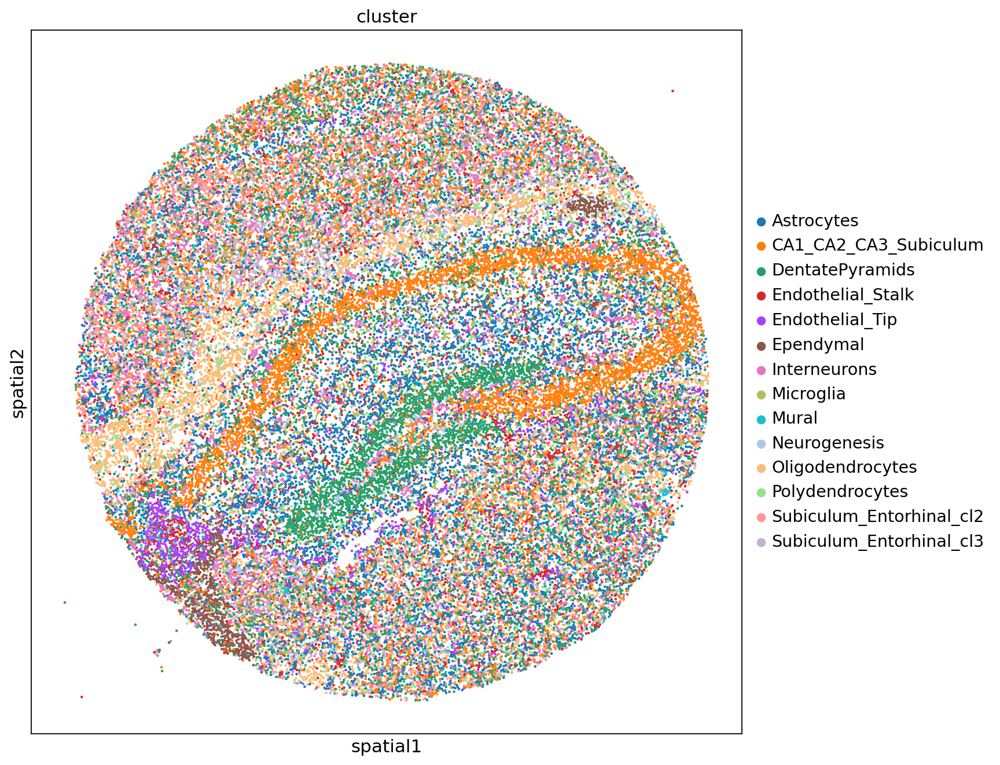

In [37]:
sc.set_figure_params(figsize=(10, 10))
fig, ax = plt.subplots(1, 1)
sc.pl.spatial(
    adata,
    color="cluster",
    spot_size=20,
    ax=ax,  # crop_coord=(750, 5750, 670, 5700)
)

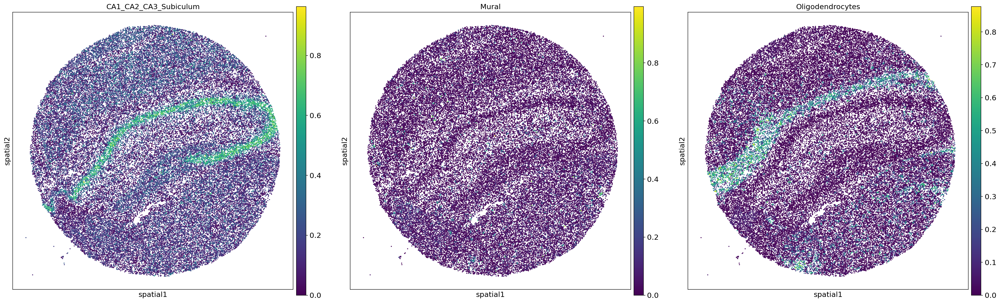

In [39]:
sc.pl.spatial(
    sq.pl.extract(adata, "deconvolution_results"),
    color=["CA1_CA2_CA3_Subiculum", "Mural", "Oligodendrocytes"],
    spot_size=20,
)

In [44]:
adata_filt = adata[:, adata.var.highly_variable].copy()

/home/icb/giovanni.palla/miniconda3/envs/spatial/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [45]:
adata_filt

AnnData object with n_obs × n_vars = 41786 × 4000
    obs: 'barcode', 'x', 'y', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_MT', 'log1p_total_counts_MT', 'pct_counts_MT', 'n_counts', 'leiden', 'cluster'
    var: 'MT', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'hvg', 'log1p', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'cluster_colors', 'spatial_neighbors'
    obsm: 'spatial', 'X_pca', 'X_umap', 'deconvolution_results'
    varm: 'PCs'
    obsp: 'distances', 'connectivities', 'spatial_connectivities', 'spatial_distances'

In [42]:
sq.gr.spatial_neighbors(adata)

In [46]:
adata.write(
    "/storage/groups/ml01/datasets/raw/20201214_SquidpyData_giovanni.palla/tutorial_data/slideseqv2.h5ad"
)

In [2]:
adata = sc.read(
    "/storage/groups/ml01/datasets/raw/20201214_SquidpyData_giovanni.palla/tutorial_data/slideseqv2.h5ad"
)

In [48]:
adata_filt

AnnData object with n_obs × n_vars = 41786 × 4000
    obs: 'barcode', 'x', 'y', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_MT', 'log1p_total_counts_MT', 'pct_counts_MT', 'n_counts', 'leiden', 'cluster'
    var: 'MT', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'hvg', 'log1p', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'cluster_colors', 'spatial_neighbors'
    obsm: 'spatial', 'X_pca', 'X_umap', 'deconvolution_results'
    varm: 'PCs'
    obsp: 'distances', 'connectivities', 'spatial_connectivities', 'spatial_distances'